In [69]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import RandomizedSearchCV
from joblib import dump, load
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import random
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.utils import to_categorical

In [ ]:
# Ruta de acceso al dataset
path = '/content/data/dataset/'

In [4]:
# Leer archivo de clases
classes = pd.read_csv(path + 'classes.csv', names=['clase_detallada', 'id_clase_detallada', 'clase_general', 'id_clase_general', 'Iconic Image Path', 'Product Description Path'], header=0)

In [ ]:
# Se tienen 81 clases detalladas que corresponden a marcas y/o productos diferentes para las 3 categorias (frutas, empaques y vegetales)
print("cantidad de clases detalladas: ", len(classes['clase_detallada'].unique()))

cantidad de clases detalladas:  81


In [ ]:
# Se listan las 81 marcas y/o productos detallados
classes['clase_detallada'].unique()

array(['Golden-Delicious', 'Granny-Smith', 'Pink-Lady', 'Red-Delicious',
       'Royal-Gala', 'Avocado', 'Banana', 'Kiwi', 'Lemon', 'Lime',
       'Mango', 'Cantaloupe', 'Galia-Melon', 'Honeydew-Melon',
       'Watermelon', 'Nectarine', 'Orange', 'Papaya', 'Passion-Fruit',
       'Peach', 'Anjou', 'Conference', 'Kaiser', 'Pineapple', 'Plum',
       'Pomegranate', 'Red-Grapefruit', 'Satsumas', 'Bravo-Apple-Juice',
       'Bravo-Orange-Juice', 'God-Morgon-Apple-Juice',
       'God-Morgon-Orange-Juice',
       'God-Morgon-Orange-Red-Grapefruit-Juice',
       'God-Morgon-Red-Grapefruit-Juice', 'Tropicana-Apple-Juice',
       'Tropicana-Golden-Grapefruit', 'Tropicana-Juice-Smooth',
       'Tropicana-Mandarin-Morning', 'Arla-Ecological-Medium-Fat-Milk',
       'Arla-Lactose-Medium-Fat-Milk', 'Arla-Medium-Fat-Milk',
       'Arla-Standard-Milk', 'Garant-Ecological-Medium-Fat-Milk',
       'Garant-Ecological-Standard-Milk', 'Oatly-Natural-Oatghurt',
       'Oatly-Oat-Milk', 'Arla-Ecological-Sou

In [ ]:
# Se tienen 43 clases generales que correspoden al numero de productos, algunos de estos productos se subdividen en marcas y/o clases detalladas.
print("Cantidad de clases generales: " + str(len(classes['clase_general'].unique())))

Cantidad de clases generales: 43


In [ ]:
# Se listan los 43 productos (clases generales)
classes['clase_general'].unique()

array(['Apple', 'Avocado', 'Banana', 'Kiwi', 'Lemon', 'Lime', 'Mango',
       'Melon', 'Nectarine', 'Orange', 'Papaya', 'Passion-Fruit', 'Peach',
       'Pear', 'Pineapple', 'Plum', 'Pomegranate', 'Red-Grapefruit',
       'Satsumas', 'Juice', 'Milk', 'Oatghurt', 'Oat-Milk', 'Sour-Cream',
       'Sour-Milk', 'Soyghurt', 'Soy-Milk', 'Yoghurt', 'Asparagus',
       'Aubergine', 'Cabbage', 'Carrots', 'Cucumber', 'Garlic', 'Ginger',
       'Leek', 'Mushroom', 'Onion', 'Pepper', 'Potato', 'Red-Beet',
       'Tomato', 'Zucchini'], dtype=object)

In [ ]:
# Lee los 3 archivos txt con la información de las imágenes
# El conjunto de entrenamiento (train) se usara para ajustar los hiperparámetros de los modelos.
# El conjunto de prueba (test) se usara para seleccionar el mejor modelo.
# Y el conjunto de validación (valid) se usara para realizar el análisis de resultados del modelo.
train_txt = pd.read_csv(path + '/train.txt', sep=',', names=['ruta', 'id_clase_detallada', 'id_clase_general'])
test_txt = pd.read_csv(path + '/test.txt', sep=',', names=['ruta', 'id_clase_detallada', 'id_clase_general'])
val_txt = pd.read_csv(path + '/val.txt', sep=',', names=['ruta', 'id_clase_detallada', 'id_clase_general'])

In [ ]:
# Muestra la cantidad de imágenes en cada conjunto de datos
# Se tienen aproximadamente 2500 datos para el conjunto de entrenamiento asi como para el conunto de prueba y un 10% en magnitud de datos para validacion del modelo
print('Cantidad de imágenes en el conjunto de entrenamiento:', len(train_txt))
print('Cantidad de imágenes en el conjunto de prueba:', len(test_txt))
print('Cantidad de imágenes en el conjunto de validación:', len(val_txt))

Cantidad de imágenes en el conjunto de entrenamiento: 2640
Cantidad de imágenes en el conjunto de prueba: 2485
Cantidad de imágenes en el conjunto de validación: 296


In [11]:
# Unirle los nombres de las clases a los conjuntos de datos
train_txt = pd.merge(train_txt, classes, on='id_clase_detallada')
test_txt = pd.merge(test_txt, classes, on='id_clase_detallada')
val_txt = pd.merge(val_txt, classes, on='id_clase_detallada')

# Mantener las columnas ruta id_clase_detallada	id_clase_general_x	clase_detallada	clase_general
train_txt = train_txt[['ruta', 'id_clase_detallada', 'id_clase_general_x', 'clase_detallada', 'clase_general']]
test_txt = test_txt[['ruta', 'id_clase_detallada', 'id_clase_general_x', 'clase_detallada', 'clase_general']]
val_txt = val_txt[['ruta', 'id_clase_detallada', 'id_clase_general_x', 'clase_detallada', 'clase_general']]
train_txt = train_txt.rename(columns={'id_clase_general_x': 'id_clase_general'})
test_txt = test_txt.rename(columns={'id_clase_general_x': 'id_clase_general'})
val_txt = val_txt.rename(columns={'id_clase_general_x': 'id_clase_general'})

In [12]:
train_txt

,ruta,id_clase_detallada,id_clase_general,clase_detallada,clase_general
0,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
1,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
2,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
3,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
4,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
...,...,...,...,...,...
2635,train/Vegetables/Zucchini/Zucchini_026.jpg,80,42,Zucchini,Zucchini
2636,train/Vegetables/Zucchini/Zucchini_027.jpg,80,42,Zucchini,Zucchini
2637,train/Vegetables/Zucchini/Zucchini_028.jpg,80,42,Zucchini,Zucchini
2638,train/Vegetables/Zucchini/Zucchini_029.jpg,80,42,Zucchini,Zucchini


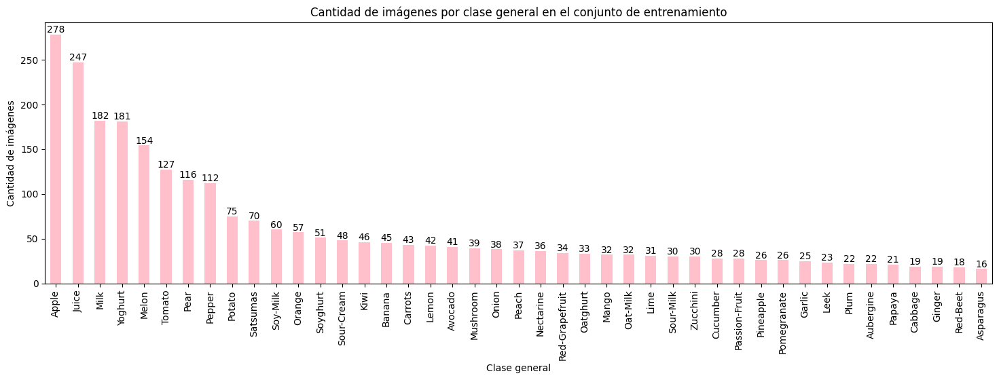

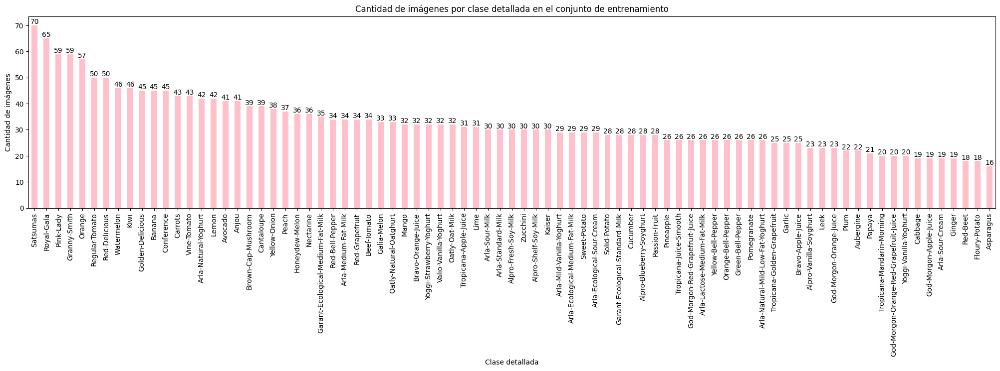

In [13]:
# Crear la gráfica de barras con la cantidad de imágenes por clase general en el conjunto de entrenamiento
ax = train_txt['clase_general'].value_counts().plot(kind='bar', figsize=(18, 5), color='pink')

plt.title('Cantidad de imágenes por clase general en el conjunto de entrenamiento')
plt.xlabel('Clase general')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

# Crear la gráfica de barras con la cantidad de imágenes por clase detallada en el conjunto de entrenamiento
ax = train_txt['clase_detallada'].value_counts().plot(kind='bar', figsize=(25, 5), color='pink')

plt.title('Cantidad de imágenes por clase detallada en el conjunto de entrenamiento')
plt.xlabel('Clase detallada')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

#### A partir de las graficas anteriores se puede concluir que las clases generales que tienen una mayor cantidad de imagenes en el conjunto de entrenamiento corresponden a aquellas que presentan clases detallas (marcas). Es importante, hacer enfasis en que solo algunas de las clases generales (productos) tienen clases detalladas (marcas).

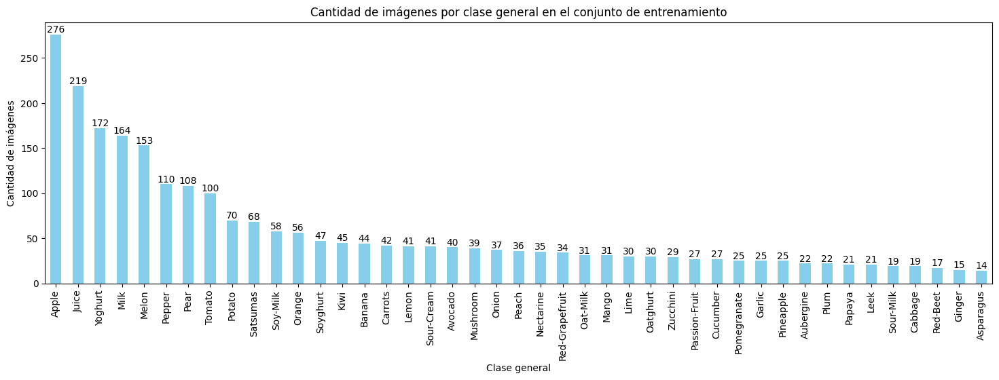

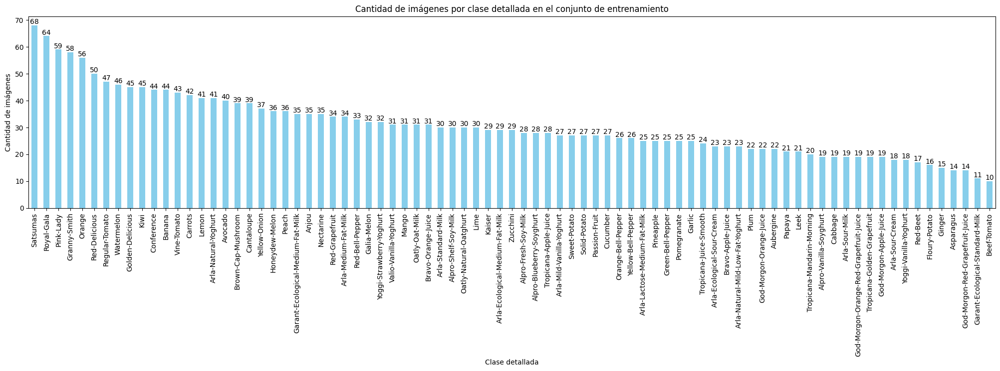

In [14]:
# Crear la gráfica de barras con la cantidad de imágenes por clase general en el conjunto de test
ax = test_txt['clase_general'].value_counts().plot(kind='bar', figsize=(18, 5), color='skyblue')

plt.title('Cantidad de imágenes por clase general en el conjunto de entrenamiento')
plt.xlabel('Clase general')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

# Crear la gráfica de barras con la cantidad de imágenes por clase detallada en el conjunto de test
ax = test_txt['clase_detallada'].value_counts().plot(kind='bar', figsize=(25, 5), color='skyblue')

plt.title('Cantidad de imágenes por clase detallada en el conjunto de entrenamiento')
plt.xlabel('Clase detallada')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

#### Se observa el mismo comportamiento descrito anteriormente, es decir, las clases generales que tienen una mayor cantidad de imagenes en el conjunto de prueba corresponden a aquellas que presentan clases detallas (marcas). Es importante, hacer enfasis en que solo algunas de las clases generales (productos) tienen clases detalladas (marcas). Adicionalmente, se observa que en ordenes de magnitud se presenta una equivalencia de cantidad de imagenes entre las marcas para los conjuntos de entrenamiento y prueba.

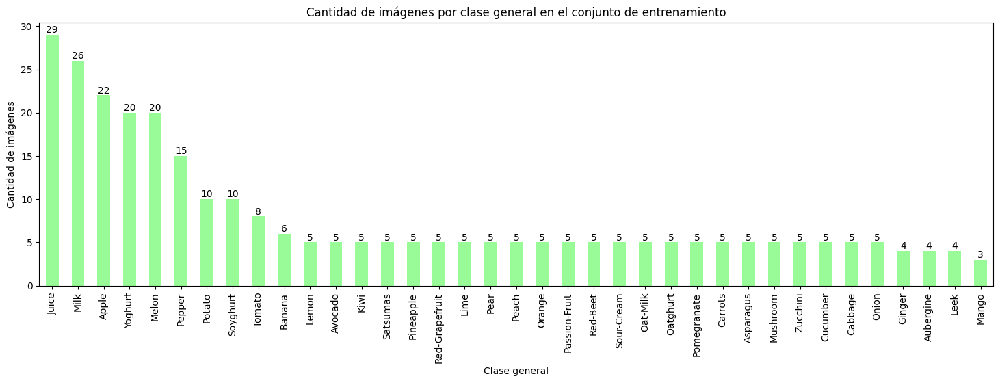

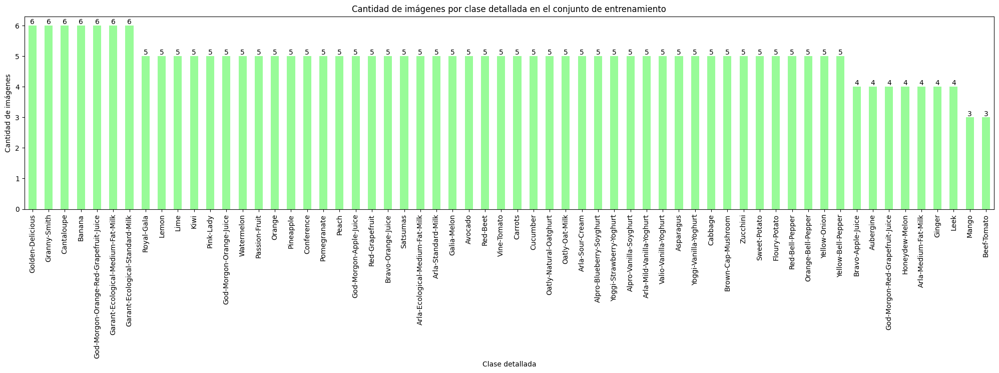

In [15]:
# Crear la gráfica de barras con la cantidad de imágenes por clase general en el conjunto de validación
ax = val_txt['clase_general'].value_counts().plot(kind='bar', figsize=(18, 5), color='palegreen')

plt.title('Cantidad de imágenes por clase general en el conjunto de entrenamiento')
plt.xlabel('Clase general')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

# Crear la gráfica de barras con la cantidad de imágenes por clase detallada en el conjunto de validación
ax = val_txt['clase_detallada'].value_counts().plot(kind='bar', figsize=(25, 5), color='palegreen')

plt.title('Cantidad de imágenes por clase detallada en el conjunto de entrenamiento')
plt.xlabel('Clase detallada')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

#### A partir de las graficas anteriores se puede concluir que las clases generales (productos) que tienen una mayor cantidad de imagenes en el conjunto de validacion corresponden a aquellas que presentan clases detallas (marcas). Sin embargo, para validar la calidad del modelo se tienen entre 4 y 6 imagenes por marca y/o producto.

In [16]:
# Características de las imágenes
from PIL import Image

caracteristicas_imagenes = []

for i in range(len(train_txt)):
    imagen = Image.open(path + train_txt['ruta'][i])
    caracteristicas_imagenes.append([imagen.size[0], imagen.size[1], imagen.mode, str(imagen.size[0]) + 'x' + str(imagen.size[1]) + 'x' + imagen.mode])

caracteristicas_imagenes = pd.DataFrame(caracteristicas_imagenes, columns=['Ancho', 'Alto', 'Modo', 'Características'])

In [ ]:
# Se tienen valores de Ancho de imagen de 348 y 464
# Se tieen valores de Alto de imagen de 348 y 464 
# Todos los 'Modos' de las imagenes corresponden a RGB
# En total se tienen 3 tamanos de imagenes diferentes
for col in caracteristicas_imagenes.columns:
    print(f"Valores únicos en la columna '{col}': {caracteristicas_imagenes[col].unique()}")

Valores únicos en la columna 'Ancho': [348 464]
Valores únicos en la columna 'Alto': [348 464]
Valores únicos en la columna 'Modo': ['RGB']
Valores únicos en la columna 'Características': ['348x348xRGB' '348x464xRGB' '464x348xRGB']


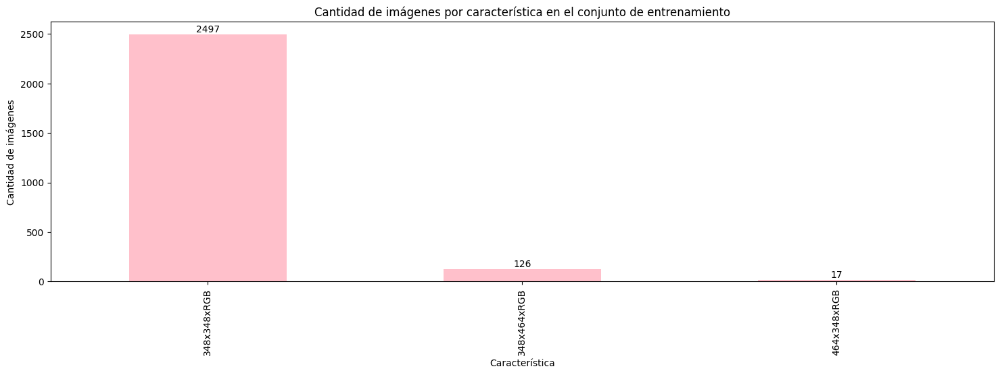

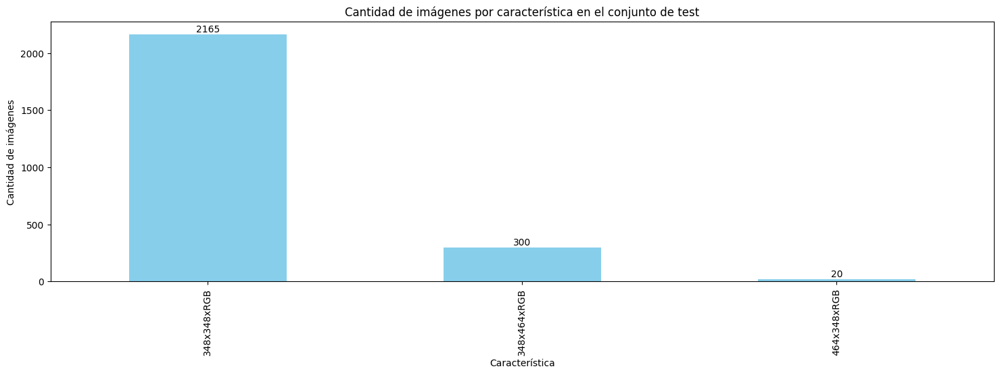

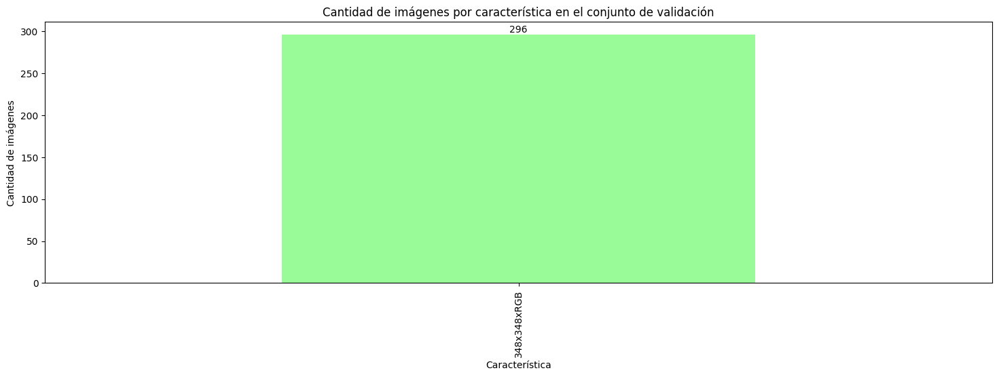

In [18]:
# Crear la gráfica de barras con la cantidad de imágenes por característica en el conjunto de entrenamiento
ax = caracteristicas_imagenes['Características'].value_counts().plot(kind='bar', figsize=(18, 5), color='pink')

plt.title('Cantidad de imágenes por característica en el conjunto de entrenamiento')
plt.xlabel('Característica')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

# Crear la gráfica de barras con la cantidad de imágenes por característica en el conjunto de test
caracteristicas_imagenes = []

for i in range(len(test_txt)):
    imagen = Image.open(path + test_txt['ruta'][i])
    caracteristicas_imagenes.append([imagen.size[0], imagen.size[1], imagen.mode, str(imagen.size[0]) + 'x' + str(imagen.size[1]) + 'x' + imagen.mode])

caracteristicas_imagenes = pd.DataFrame(caracteristicas_imagenes, columns=['Ancho', 'Alto', 'Modo', 'Características'])

ax = caracteristicas_imagenes['Características'].value_counts().plot(kind='bar', figsize=(18, 5), color='skyblue')

plt.title('Cantidad de imágenes por característica en el conjunto de test')
plt.xlabel('Característica')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

# Crear la gráfica de barras con la cantidad de imágenes por característica en el conjunto de validación
caracteristicas_imagenes = []

for i in range(len(val_txt)):
    imagen = Image.open(path + val_txt['ruta'][i])
    caracteristicas_imagenes.append([imagen.size[0], imagen.size[1], imagen.mode, str(imagen.size[0]) + 'x' + str(imagen.size[1]) + 'x' + imagen.mode])

caracteristicas_imagenes = pd.DataFrame(caracteristicas_imagenes, columns=['Ancho', 'Alto', 'Modo', 'Características'])

ax = caracteristicas_imagenes['Características'].value_counts().plot(kind='bar', figsize=(18, 5), color='palegreen')

plt.title('Cantidad de imágenes por característica en el conjunto de validación')
plt.xlabel('Característica')
plt.ylabel('Cantidad de imágenes')

for p in ax.patches:
    ax.annotate(str(p.get_height()),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.show()

#### De las graficas anteriores se hace evidente que para los 3 conjuntos de imagenes (entrenamiento, test y validacion) en su mayoria presentan tamanos de 348x348

## Aumentación de datos

In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Seleccionar las clases con menos de 100 imágenes
clases_menor_100 = train_txt['clase_general'].value_counts()[train_txt['clase_general'].value_counts() < 100].index

In [ ]:
# Crear un generador de imágenes aumentadas
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

if not os.path.exists(path + 'augmented_images'):
    os.makedirs(path + 'augmented_images')

for clase in clases_menor_100:
    # Crear un directorio para cada clase
    if not os.path.exists(path + f'augmented_images/{clase}'):
        os.makedirs(path + f'augmented_images/{clase}')

    # Obtener las imágenes de la clase
    imagenes = train_txt[train_txt['clase_general'] == clase]['ruta']

    # Para cada imagen de esa clase
    for imagen in imagenes:
        img_path = os.path.join(path, imagen)  # Ruta completa de la imagen
        img = Image.open(img_path)

        # Convertir la imagen a un array NumPy
        x = np.array(img)

        # Ajustar la forma de la imagen para que sea compatible con el generador
        x = x.reshape((1,) + x.shape)

        # Generar imágenes aumentadas
        i = 0
        for batch in datagen.flow(x, batch_size=1, save_to_dir=path+f'augmented_images/{clase}', save_prefix=clase, save_format='jpeg'):
            i += 1
            if i >= 2:  # Generar un máximo de 2 imágenes por cada imagen original
                break

In [ ]:
# Crear las imágenes aumentadas para las clases generales (productoa) con menos de 100 imágenes
new_images = []  # Lista para almacenar nuevas rutas de imágenes

for clase in clases_menor_100:
    # Obtener las imágenes aumentadas
    augmented_images = os.listdir(path + f'augmented_images/{clase}')

    # Para cada imagen aumentada
    for augmented_img_name in augmented_images:

        # Agregar la nueva ruta al dataframe
        new_images.append({
            'ruta': 'augmented_images' + '/' + clase + '/' + augmented_img_name,
            'id_clase_detallada': train_txt[train_txt['clase_general'] == clase]['id_clase_detallada'].values[0],
            'id_clase_general': train_txt[train_txt['clase_general'] == clase]['id_clase_general'].values[0],
            'clase_detallada': train_txt[train_txt['clase_general'] == clase]['clase_detallada'].values[0],
            'clase_general': clase
        })

# Convertir la lista de nuevas imágenes en un dataframe
new_images_df = pd.DataFrame(new_images)

# Concatenar el dataframe original con las imágenes aumentadas
train_txt_aumentacion = pd.concat([train_txt, new_images_df], ignore_index=True)

# Mostrar las primeras filas del dataframe final con las imágenes aumentadas
print(train_txt_aumentacion.head())

                                                ruta  id_clase_detallada  \
0  train/Fruit/Apple/Golden-Delicious/Golden-Deli...                   0   
1  train/Fruit/Apple/Golden-Delicious/Golden-Deli...                   0   
2  train/Fruit/Apple/Golden-Delicious/Golden-Deli...                   0   
3  train/Fruit/Apple/Golden-Delicious/Golden-Deli...                   0   
4  train/Fruit/Apple/Golden-Delicious/Golden-Deli...                   0   

   id_clase_general   clase_detallada clase_general  
0                 0  Golden-Delicious         Apple  
1                 0  Golden-Delicious         Apple  
2                 0  Golden-Delicious         Apple  
3                 0  Golden-Delicious         Apple  
4                 0  Golden-Delicious         Apple  


In [21]:
train_txt_aumentacion

,ruta,id_clase_detallada,id_clase_general,clase_detallada,clase_general
0,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
1,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
2,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
3,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
4,train/Fruit/Apple/Golden-Delicious/Golden-Deli...,0,0,Golden-Delicious,Apple
...,...,...,...,...,...
5112,augmented_images/Asparagus/Asparagus_0_6723.jpeg,59,28,Asparagus,Asparagus
5113,augmented_images/Asparagus/Asparagus_0_580.jpeg,59,28,Asparagus,Asparagus
5114,augmented_images/Asparagus/Asparagus_0_9540.jpeg,59,28,Asparagus,Asparagus
5115,augmented_images/Asparagus/Asparagus_0_9226.jpeg,59,28,Asparagus,Asparagus


## Modelos

### Modelo Ramdom Forest

In [22]:
# Función para cargar imágenes y preprocesarlas
def cargar_imagen(ruta, shape=(224, 224)):
    # Cargar la imagen con OpenCV
    img = cv2.imread(path + ruta)
    # Cambiar tamaño para que todas tengan la misma forma
    img = cv2.resize(img, shape)
    # Normalizar valores de píxeles (escala de 0 a 1)
    img = img / 255.0
    # Aplanar la imagen a un vector
    return img.flatten()

In [23]:
X_train = []
Y_train = []

for index, row in train_txt_aumentacion.iterrows():
    # Cargar la imagen
    imagen = cargar_imagen(row['ruta'], shape=(224, 224))
    # Agregar la imagen al conjunto de datos
    X_train.append(imagen)
    # Agregar la clase al conjunto de etiquetas
    Y_train.append(row['clase_general'])

# Convertir a arrays de NumPy
X_train = np.array(X_train)
Y_train = np.array(Y_train)

X_test = []
Y_test = []

for index, row in test_txt.iterrows():
    # Cargar la imagen
    imagen = cargar_imagen(row['ruta'], shape=(224, 224))
    # Agregar la imagen al conjunto de datos
    X_test.append(imagen)
    # Agregar la clase al conjunto de etiquetas
    Y_test.append(row['clase_general'])

# Convertir a arrays de NumPy
X_test = np.array(X_test)
Y_test = np.array(Y_test)

X_val = []
Y_val = []

for index, row in val_txt.iterrows():
    # Cargar la imagen
    imagen = cargar_imagen(row['ruta'], shape=(224, 224))
    # Agregar la imagen al conjunto de datos
    X_val.append(imagen)
    # Agregar la clase al conjunto de etiquetas
    Y_val.append(row['clase_general'])

# Convertir a arrays de NumPy
X_val = np.array(X_val)
Y_val = np.array(Y_val)

# Codificar las etiquetas
le = LabelEncoder()
Y_train = le.fit_transform(Y_train)
Y_test = le.transform(Y_test)
Y_val = le.transform(Y_val)

In [30]:
# Crear el modelo de clasificación
modelo_1 = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)

# Entrenar el modelo
modelo_1.fit(X_train, Y_train)

# Predecir las clases en el conjunto de prueba
Y_pred = modelo_1.predict(X_test)

# Mostrar el reporte de clasificación
print(classification_report(Y_test, Y_pred, target_names=le.classes_))

# Guardar el modelo
dump(modelo_1, 'modelo_random_forest.pkl')
print("Modelo guardado como 'modelo_random_forest.pkl'")

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


                precision    recall  f1-score   support

         Apple       0.31      0.55      0.40       276
     Asparagus       0.00      0.00      0.00        14
     Aubergine       0.44      0.18      0.26        22
       Avocado       0.23      0.17      0.20        40
        Banana       0.13      0.11      0.12        44
       Cabbage       0.00      0.00      0.00        19
       Carrots       0.32      0.48      0.38        42
      Cucumber       0.40      0.07      0.12        27
        Garlic       0.00      0.00      0.00        25
        Ginger       0.00      0.00      0.00        15
         Juice       0.36      0.71      0.48       219
          Kiwi       0.17      0.11      0.14        45
          Leek       1.00      0.05      0.09        21
         Lemon       0.00      0.00      0.00        41
          Lime       0.27      0.57      0.37        30
         Mango       0.33      0.03      0.06        31
         Melon       0.31      0.03      0.06  

Matriz de confusión:
[[153   0   0 ...  28   2   0]
 [  5   0   0 ...   0   0   1]
 [  8   0   4 ...   1   0   2]
 ...
 [  9   0   0 ...  85   0   0]
 [  2   0   0 ...   0  66   0]
 [  9   0   0 ...   0   0   5]]


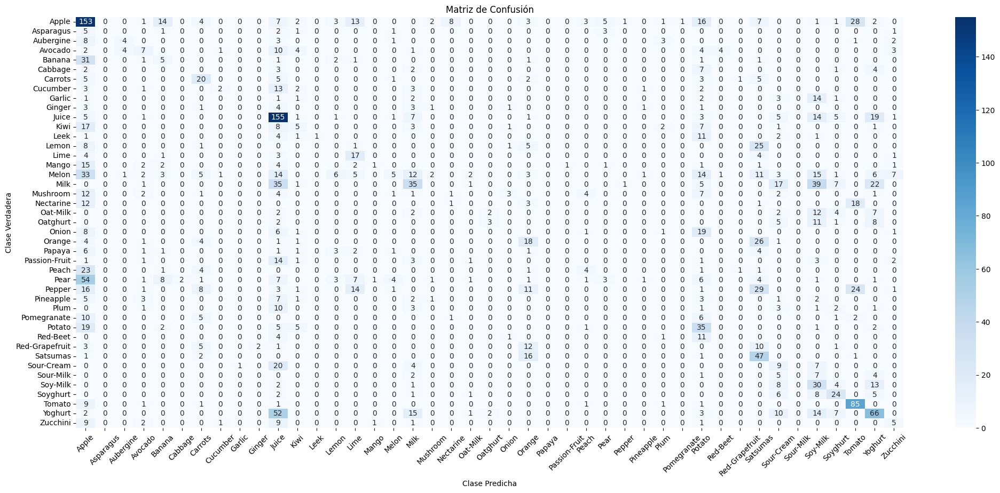

In [38]:
# Mostrar la matriz de confusión para el modelo 1
matriz_confusion = confusion_matrix(Y_test, Y_pred)

print("Matriz de confusión:")
print(matriz_confusion)

plt.figure(figsize=(25, 10))
sns.heatmap(
    matriz_confusion,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=le.classes_,
    yticklabels=le.classes_
)
plt.title("Matriz de Confusión")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Verdadera")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

#### La grafica anterior muestra la matriz de confusion entre la clase verdadera y la clase predicha (clase=producto). En la cual, se puede observar que los productos en donde el modelo acierta mas veces corresponden a: jugos [155], manzanas [153], tomates[85] y yogures [66]. Adicionalmente, los productos en donde mas se presentan errores en la clase (producto) predicha corresponden a: peras predichas como manzanas [54], yogures predichas como jugos [52], leche predicha como leche de soya [39], leche predicha como jugos [35], melones predichos como manzanas [33] y bananos precichos como manzanas [31]

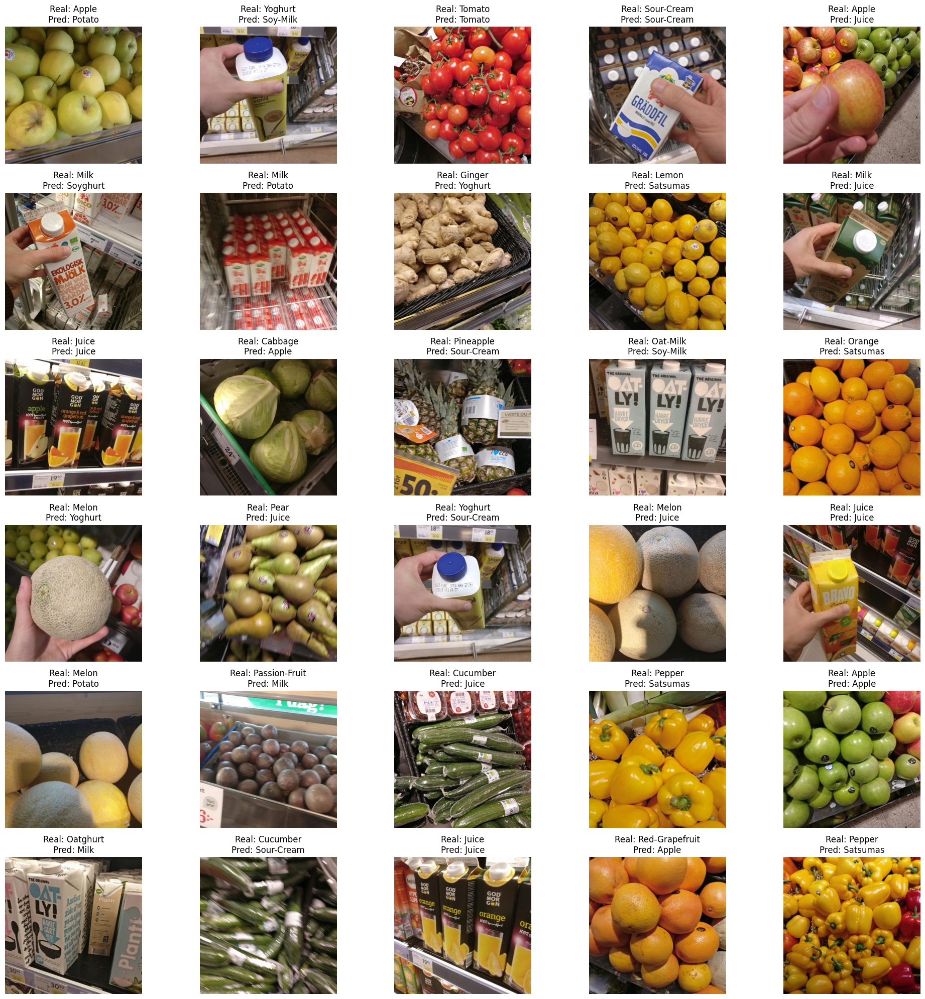

In [56]:
# Número de imágenes aleatorias a seleccionar
num_imagenes = 30

# Seleccionar 10 índices aleatorios del array X_val
indices_aleatorios = random.sample(range(len(X_val)), num_imagenes)

# Crear una figura para mostrar las imágenes
plt.figure(figsize=(20, 20))

for i, idx in enumerate(indices_aleatorios):
    img_path = val_txt.iloc[idx]['ruta']

    clase_real = val_txt.iloc[idx]['clase_general']
    img = X_val[idx]

    # Predecir la clase usando el modelo
    img_reshaped = img.reshape(1, -1)
    prediccion = modelo_1.predict(img_reshaped)
    clase_predicha = le.inverse_transform(prediccion)[0]

    img_show = plt.imread(path + img_path)

    # Mostrar la imagen con su clase real y predicha
    plt.subplot(6, 5, i + 1)
    plt.imshow(img_show)
    plt.axis("off")
    plt.title(f"Real: {clase_real}\nPred: {clase_predicha}")

plt.tight_layout()
plt.show()

#### Se puede observar que el desempeño del modelo no es adecuado , esto puede deberse al tipo de modelo, ya que, Random Forest no es adecuado para la clasificación de imágenes porque no está diseñado para capturar las relaciones espaciales y la alta dimensionalidad de los datos visuales.
#### Mientras que Random Forest puede funcionar bien en datos tabulares (con características separadas), las imágenes requieren modelos que puedan extraer patrones espaciales complejos, como las Redes Neuronales Convolucionales(CNNs). Estas redes están específicamente diseñadas para trabajar con imágenes y aprenden representaciones jerárquicas que las hacen mucho más efectivas para tareas de clasificación de imágenes.

### Modelo Inception-v3 convolutional neural network

In [82]:
def load_and_preprocess_images(df, img_size=(299, 299)):
    """
    Carga y preprocesa las imágenes a partir de un dataframe con rutas.
    """
    images = []
    labels = []

    for idx, row in df.iterrows():
        # Leer la imagen
        img_path = path + row['ruta']
        img = image.load_img(img_path, target_size=img_size)
        img_array = image.img_to_array(img)
        img_array = preprocess_input(img_array)

        images.append(img_array)
        labels.append(row['id_clase_general'])

    return np.array(images), np.array(labels)

In [83]:
# Cargar y preprocesar imágenes de entrenamiento, validación y prueba
X_train, Y_train = load_and_preprocess_images(train_txt)
X_val, Y_val = load_and_preprocess_images(val_txt)
X_test, Y_test = load_and_preprocess_images(test_txt)

# Codificar las etiquetas en formato one-hot
Y_train = to_categorical(Y_train)
Y_val = to_categorical(Y_val)
Y_test = to_categorical(Y_test)

# Verificar las formas de los conjuntos
print(f'X_train shape: {X_train.shape}, Y_train shape: {Y_train.shape}')
print(f'X_val shape: {X_val.shape}, Y_val shape: {Y_val.shape}')
print(f'X_test shape: {X_test.shape}, Y_test shape: {Y_test.shape}')

X_train shape: (2640, 299, 299, 3), Y_train shape: (2640, 43)
X_val shape: (296, 299, 299, 3), Y_val shape: (296, 43)
X_test shape: (2485, 299, 299, 3), Y_test shape: (2485, 43)


In [84]:
# Cargar InceptionV3 preentrenado, excluyendo la capa superior
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Descongelar las capas del modelo base
base_model.trainable = True

# Construir el modelo
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Regularización con Dropout
predictions = Dense(le.classes_.shape[0], activation='softmax')(x)  # Capa de salida

# Crear el modelo completo
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [86]:
history = model.fit(
    X_train,
    Y_train,
    epochs=5,
    validation_data=(X_val, Y_val)
)

Epoch 1/5
83/83 [==============================] - 198s 2s/step - loss: 0.4386 - accuracy: 0.9000 - val_loss: 0.9330 - val_accuracy: 0.7264
Epoch 2/5
83/83 [==============================] - 193s 2s/step - loss: 0.0964 - accuracy: 0.9803 - val_loss: 0.6671 - val_accuracy: 0.7973
Epoch 3/5
83/83 [==============================] - 192s 2s/step - loss: 0.0564 - accuracy: 0.9875 - val_loss: 0.8648 - val_accuracy: 0.7736
Epoch 4/5
83/83 [==============================] - 193s 2s/step - loss: 0.0292 - accuracy: 0.9951 - val_loss: 0.6479 - val_accuracy: 0.8311
Epoch 5/5
83/83 [==============================] - 196s 2s/step - loss: 0.0220 - accuracy: 0.9955 - val_loss: 0.5631 - val_accuracy: 0.8412


In [92]:
model.save('modelo_inception.h5')

print("Modelo guardado como 'modelo_inception.h5'")

Modelo guardado como 'modelo_inception.h5'


In [87]:
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Obtener las clases predichas

# Obtener las clases verdaderas
y_true = np.argmax(Y_test, axis=1)  # Si Y_test es one-hot encoded, usamos argmax para obtener las clases verdaderas

# Imprimir el reporte de clasificación
print(classification_report(y_true, y_pred_classes, target_names=le.classes_))

78/78 [==============================] - 27s 319ms/step
                precision    recall  f1-score   support

         Apple       0.89      0.92      0.90       276
     Asparagus       0.85      0.70      0.77        40
     Aubergine       0.86      1.00      0.93        44
       Avocado       0.77      0.67      0.71        45
        Banana       0.49      0.46      0.47        41
       Cabbage       0.60      0.10      0.17        30
       Carrots       0.43      0.74      0.54        31
      Cucumber       0.97      0.90      0.93       153
        Garlic       0.63      0.97      0.76        35
        Ginger       0.44      0.61      0.51        56
         Juice       0.77      0.95      0.85        21
          Kiwi       0.50      0.74      0.60        27
          Leek       0.91      0.89      0.90        36
         Lemon       0.93      0.53      0.67       108
          Lime       1.00      0.96      0.98        25
         Mango       0.89      0.36      0.52  

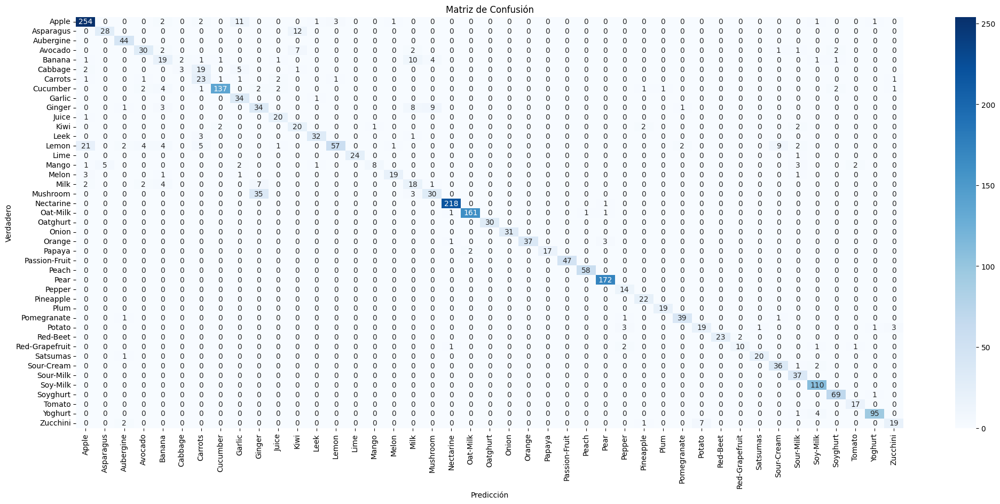

In [90]:
# Obtener las clases predichas
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las clases verdaderas (si Y_test está en formato one-hot, usamos argmax)
y_true = np.argmax(Y_test, axis=1)

# Generar la matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Crear un mapa de calor para la matriz de confusión
plt.figure(figsize=(25, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicción')
plt.ylabel('Verdadero')
plt.title('Matriz de Confusión')
plt.show()

#### Se puede observar que el desempeño del modelo de la red neuronal convolucional es mejor que el Ramdom Forest, mejorando el Accuracy en 0.57, por lo cual, el modelo actual tiene 87% de predicciones correctas sobre el numero total de predicciones.
#### Adicionalmente, se puede observar que los productos en donde mas se presentan errores en la clase (producto) predicha corresponden a: champiñones predichos como jengibres [35] y, limones predichos como manzanaas [21].

1/1 [==============================] - 0s 70ms/step


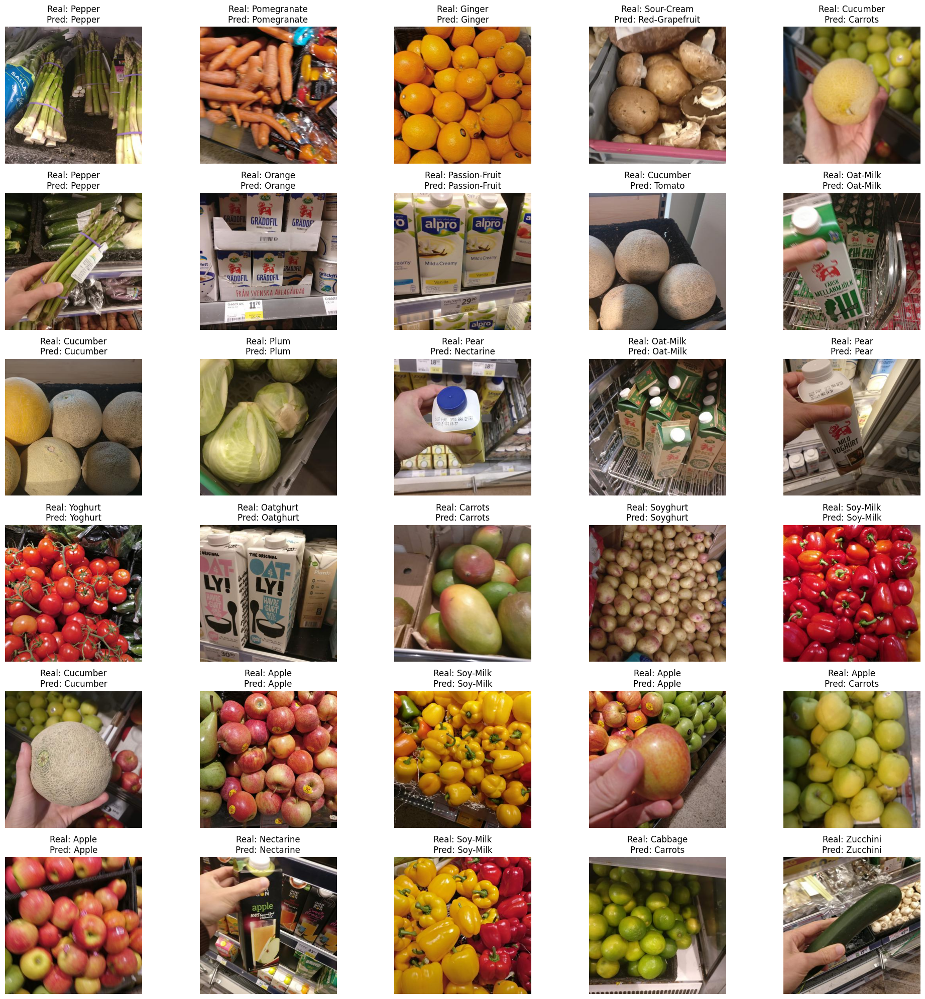

In [96]:
# Número de imágenes aleatorias a seleccionar
num_imagenes = 30

# Seleccionar índices aleatorios del conjunto de validación
indices_aleatorios = random.sample(range(len(X_val)), num_imagenes)

# Cargar y preprocesar las imágenes de validación usando el DataFrame `val_txt`
X_val_preprocessed, Y_val_preprocessed = load_and_preprocess_images(val_txt)

# Crear una figura para mostrar las imágenes
plt.figure(figsize=(20, 20))

for i, idx in enumerate(indices_aleatorios):
    # Obtener el array de la imagen
    img = X_val_preprocessed[idx]
    clase_real = Y_val_preprocessed[idx]  # Clase real del conjunto de validación

    # Predecir la clase usando el modelo InceptionV3
    img_resized = np.expand_dims(img, axis=0)  # Convertir a batch de tamaño 1
    prediccion = model.predict(img_resized)
    clase_predicha = np.argmax(prediccion, axis=1)
    clase_predicha = le.inverse_transform(clase_predicha)[0]  # Invertir la codificación one-hot

    # Leer y mostrar la imagen original desde la ruta
    img_path = val_txt.iloc[idx]['ruta']
    img_show = plt.imread(path + img_path)

    # Mostrar la imagen con su clase real y predicha
    plt.subplot(6, 5, i + 1)
    plt.imshow(img_show)
    plt.axis("off")
    plt.title(f"Real: {le.inverse_transform([clase_real])[0]}\nPred: {clase_predicha}")

plt.tight_layout()
plt.show()

#### Segun las métricas de evalación del modelo (Accuracy) y por clase (precision, recall y f1-score) la red neuronal convolucional está logrando una alta precisión en la mayoria de las clases, pero podría estar fallando en ciertas clases difíciles o minoritarias, como los champiñones y los limones al clasificarlos como jengibres y manzanas, respectivamente.
#### El Random Forest, aunque tiene un accuracy más bajo, puede estar siendo menos sensible a este tipo de errores, ya que, es un modelo basado en árboles de decisión que realiza predicciones de forma más conservadora en ciertos casos.